# Importing Libraries


In [ ]:
# Data manipulation
import pandas as pd
import numpy as np

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns

# PCA
from sklearn.decomposition import PCA

sns.set_style('whitegrid')
sns.set_context('notebook', font_scale=1.5)
%matplotlib inline
plt.rcParams['figure.figsize'] = (12, 8)
plt.rcParams['font.size'] = 14

# Loading Data


In [26]:
df = pd.read_csv("../data/interim/data_validated.csv")
df.head()

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


# Distribution Analysis


In [ ]:
mean_cols = [col for col in df.columns if "mean" in col]
se_cols = [col for col in df.columns if "se" in col]
worst_cols = [col for col in df.columns if "worst" in col]
target = "diagnosis"

## Mean Columns


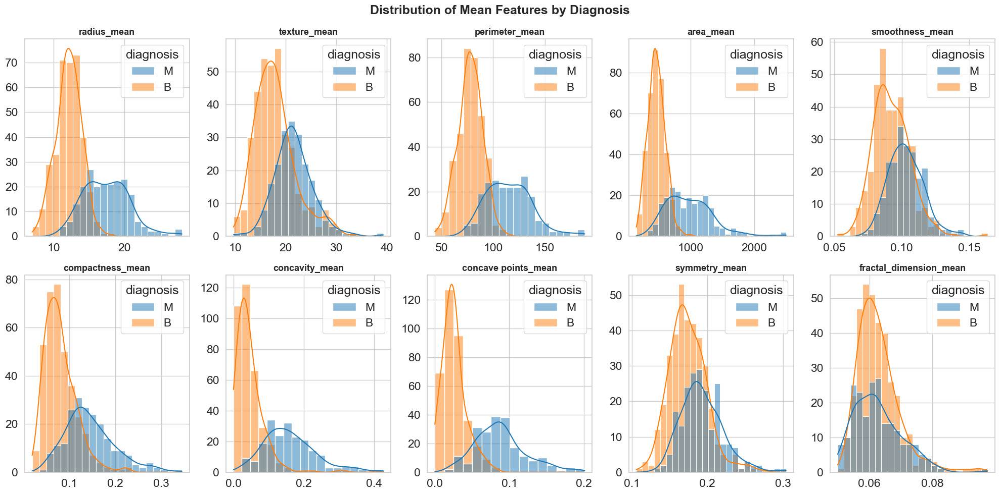

In [ ]:
fig, axes = plt.subplots(2, 5, figsize=(20, 10))
axes = axes.ravel()

for i, col in enumerate(mean_cols):
    sns.histplot(data=df, x=col, hue=target, kde=True, ax=axes[i])
    axes[i].set_title(f"{col}", fontsize=13, fontweight="bold")
    axes[i].set_xlabel("")
    axes[i].set_ylabel("")


fig.suptitle(
    "Distribution of Mean Features by Diagnosis", fontsize=18, fontweight="bold"
)
plt.subplots_adjust(wspace=0.3, hspace=0.3)
plt.tight_layout()
plt.show()

## Standard Error Columns


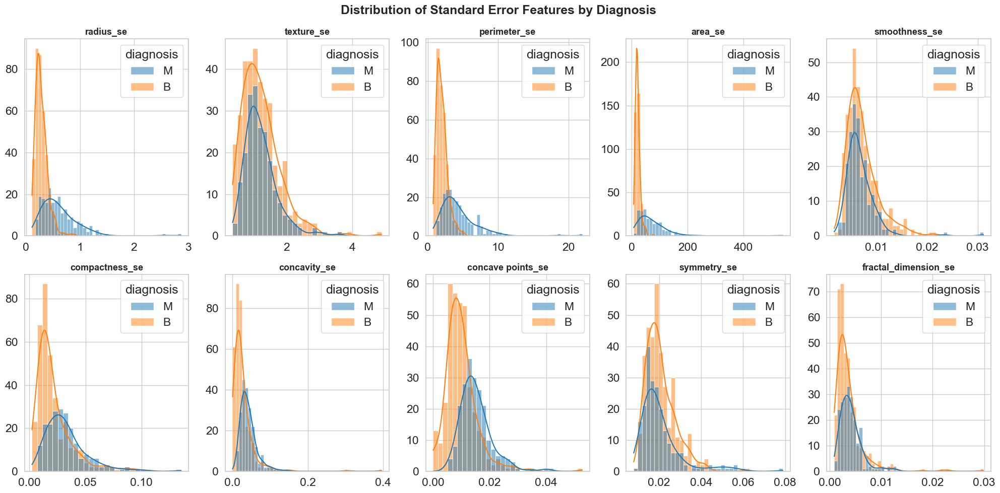

In [ ]:
fig, axes = plt.subplots(2, 5, figsize=(20, 10))
axes = axes.ravel()

for i, col in enumerate(se_cols):
    sns.histplot(data=df, x=col, hue=target, kde=True, ax=axes[i])
    axes[i].set_title(f"{col}", fontsize=13, fontweight="bold")
    axes[i].set_xlabel("")
    axes[i].set_ylabel("")


fig.suptitle(
    "Distribution of Standard Error Features by Diagnosis",
    fontsize=18,
    fontweight="bold",
)
plt.subplots_adjust(wspace=0.3, hspace=0.3)
plt.tight_layout()
plt.show()

## "Worst" Features


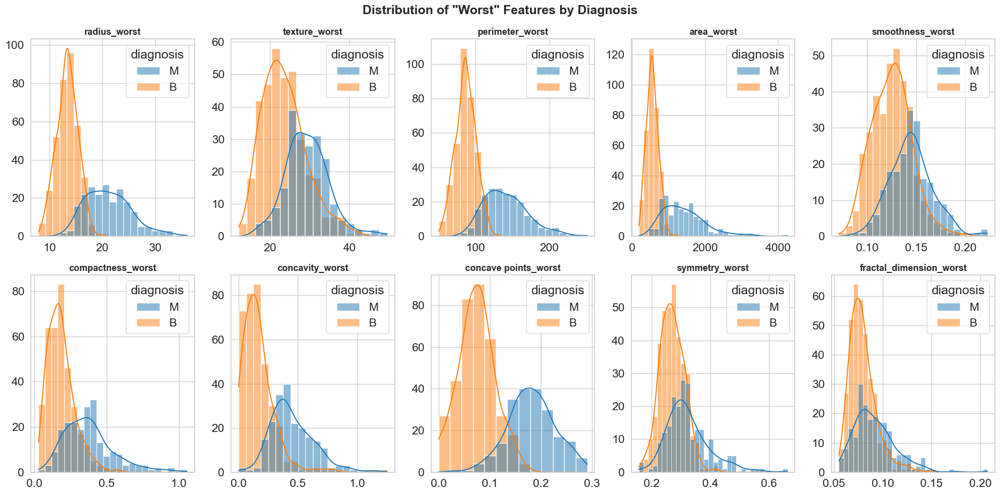

In [ ]:
fig, axes = plt.subplots(2, 5, figsize=(20, 10))
axes = axes.ravel()

for i, col in enumerate(worst_cols):
    sns.histplot(data=df, x=col, hue=target, kde=True, ax=axes[i])
    axes[i].set_title(f"{col}", fontsize=13, fontweight="bold")
    axes[i].set_xlabel("")
    axes[i].set_ylabel("")


fig.suptitle(
    'Distribution of "Worst" Features by Diagnosis', fontsize=18, fontweight="bold"
)
plt.subplots_adjust(wspace=0.3, hspace=0.3)
plt.tight_layout()
plt.show()

## Insights


- Mean Features
  - `texture`, `symmetry`, `fractal_dimension`, `smoothness` provide little to no seperation between the classes.
  - `concavity`, `compactness` and `concave points` are right skewed.
- Standard Error Features
  - `texture`, `smoothness`, `compactness`, `concavity`, `concave points`, `symmetry`, `fractal_dimension` provide little to no seperabilty.
  - All the features are extremely right skewed.
- Worst-Case Features
  - `texture`, `smoothness`, `symmetry`, `fractal_dimension` also provide minimal seperability.
  - `compactness`, `concavity` are a little right skewed.


# Correlation Analysis


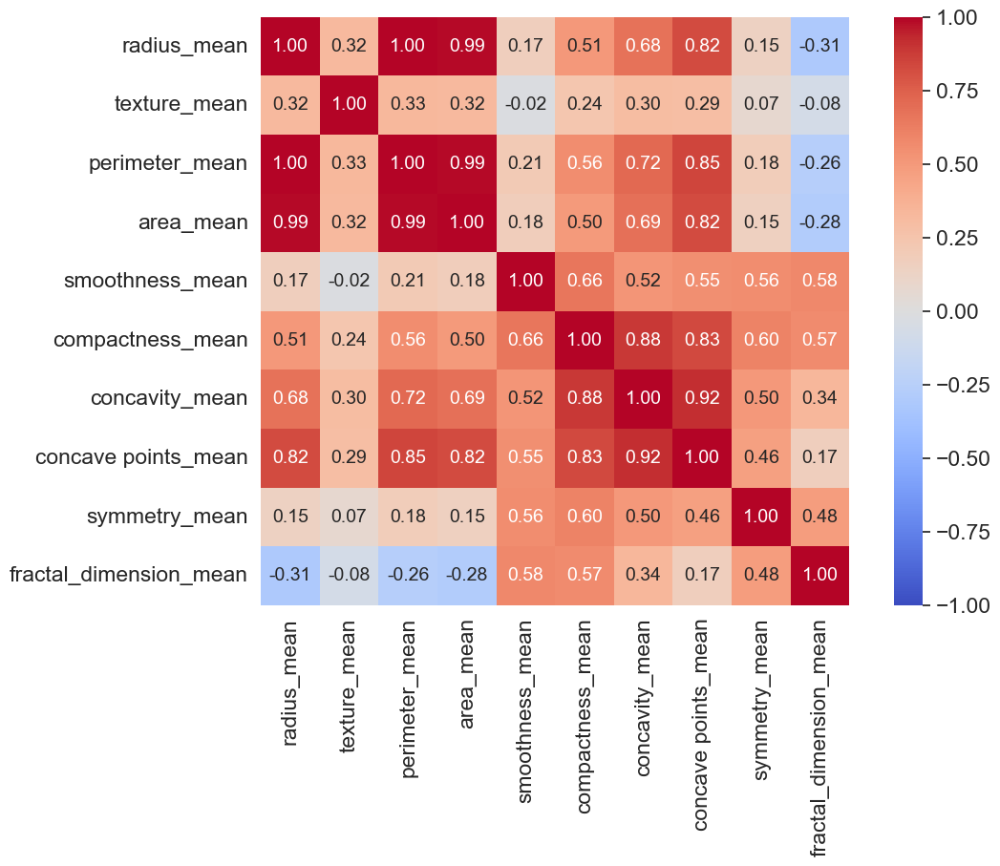

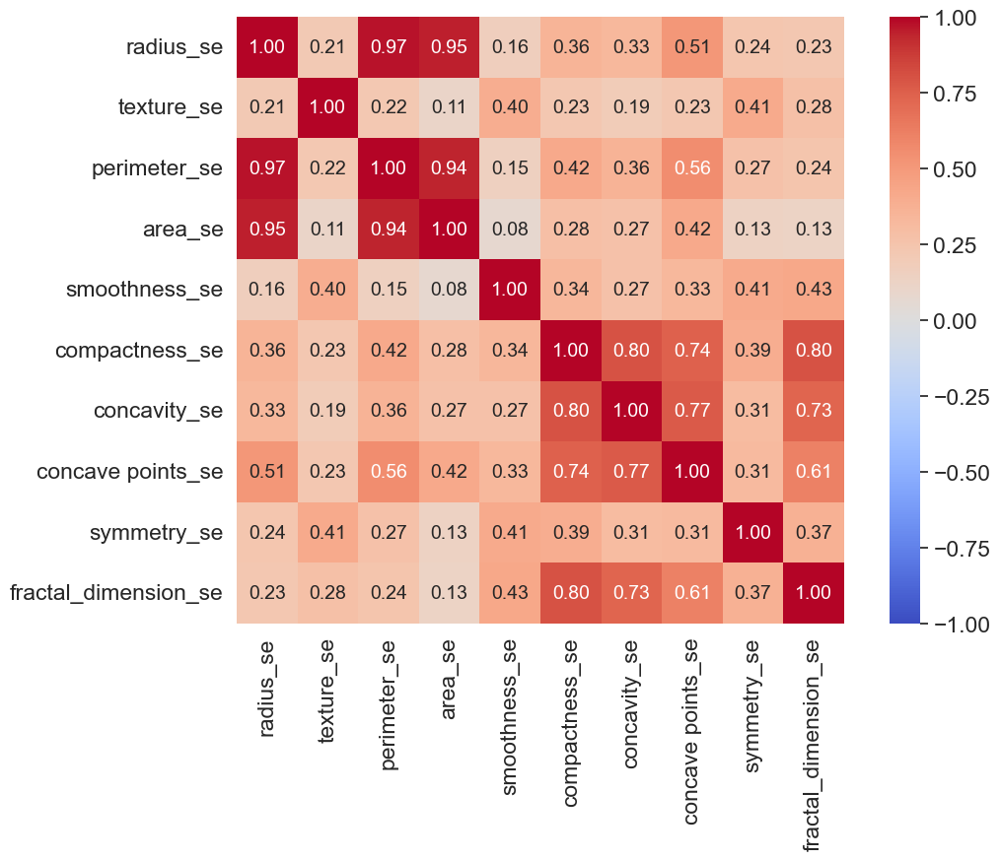

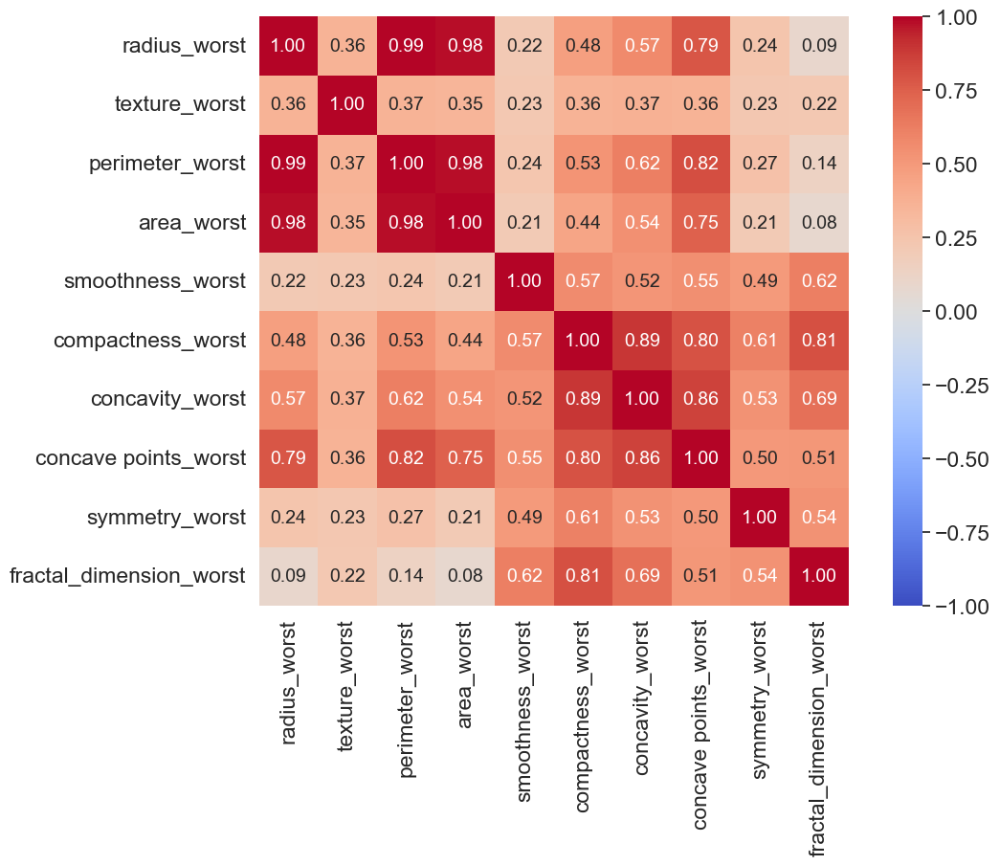

In [ ]:
corr_matrix = df[mean_cols + se_cols + worst_cols].corr()

# Since the number of features is huge, I will visualize only each set of features separately
plt.figure()
sns.heatmap(
    corr_matrix.loc[mean_cols, mean_cols],
    annot=True,
    fmt=".2f",
    cmap="coolwarm",
    square=True,
    cbar=True,
    vmin=-1,
    vmax=1,
)
plt.show()

plt.figure()
sns.heatmap(
    corr_matrix.loc[se_cols, se_cols],
    annot=True,
    fmt=".2f",
    cmap="coolwarm",
    square=True,
    cbar=True,
    vmin=-1,
    vmax=1,
)
plt.show()

plt.figure()
sns.heatmap(
    corr_matrix.loc[worst_cols, worst_cols],
    annot=True,
    fmt=".2f",
    cmap="coolwarm",
    square=True,
    cbar=True,
    vmin=-1,
    vmax=1,
)
plt.show()

## Insights


- I need to pick between radius, perimeter and area.
- I also need to pick between concavity, concave points and compactness for the mean and worst case features.


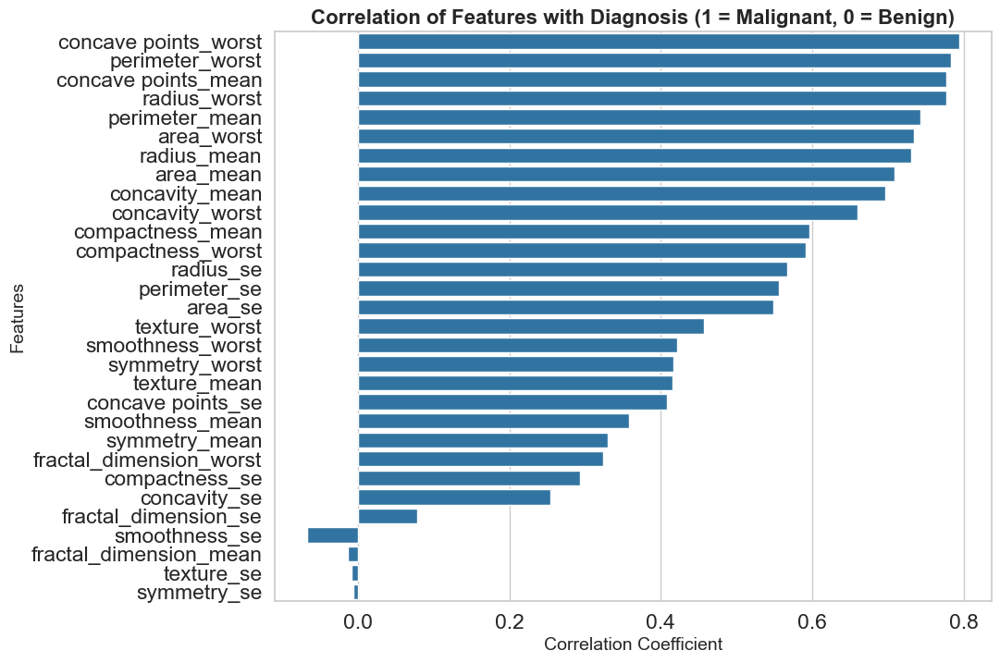

In [ ]:
mapped_target = df[target].map({"M": 1, "B": 0})
plt.figure(figsize=(10, 8))
corr_matrix_with_target = df[mean_cols + se_cols + worst_cols].corrwith(mapped_target)
corr_matrix_with_target = corr_matrix_with_target.sort_values(
    key=lambda x: abs(x), ascending=False
)
sns.barplot(x=corr_matrix_with_target.values, y=corr_matrix_with_target.index)
plt.title(
    "Correlation of Features with Diagnosis (1 = Malignant, 0 = Benign)",
    fontsize=16,
    fontweight="bold",
)
plt.xlabel("Correlation Coefficient", fontsize=14)
plt.ylabel("Features", fontsize=14)
plt.show()

## Insights

- I will choose radius since perimeter and area are derived from it.
- For mean and worst case, I will choose concave points and remove concavity and compactness
- fractal_dimension_mean, texture_se and symmetry_se have very low linear correlation with the target


In [ ]:
df = df.drop(
    columns=[
        "perimeter_mean",
        "area_mean",
        "perimeter_se",
        "area_se",
        "perimeter_worst",
        "area_worst",
        "concavity_mean",
        "compactness_mean",
        "concavity_worst",
        "compactness_worst",
    ]
)
mean_cols = [col for col in df.columns if "mean" in col]
se_cols = [col for col in df.columns if "se" in col]
worst_cols = [col for col in df.columns if "worst" in col]

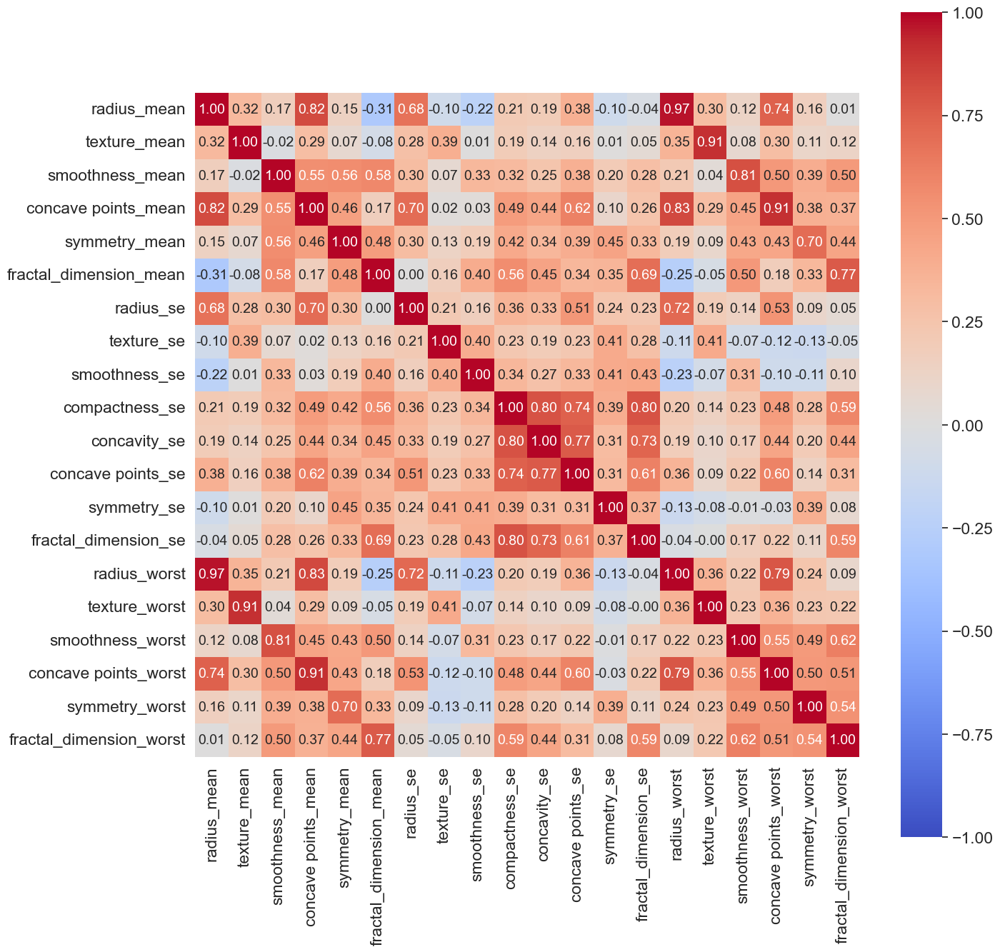

In [ ]:
# Checking feature correlation again
plt.figure(figsize=(15, 15))
sns.heatmap(
    df[mean_cols + se_cols + worst_cols].corr(),
    annot=True,
    fmt=".2f",
    cmap="coolwarm",
    square=True,
    cbar=True,
    vmin=-1,
    vmax=1,
)
plt.show()

## Insights


- For radius, texture and concave points, I will remove the worst and keep the mean.


In [ ]:
df = df.drop(columns=["radius_worst", "texture_worst", "concave points_worst"])
mean_cols = [col for col in df.columns if "mean" in col]
se_cols = [col for col in df.columns if "se" in col]
worst_cols = [col for col in df.columns if "worst" in col]

# Multivariate Analysis


The point of this section is to mainly check if the features that didn't separate between the classes alone could maybe separate it when combined with another feature.


What I'm looking for is a clear separation, and if I found one for a feature I marked as no separability earlier, I will not remove it.


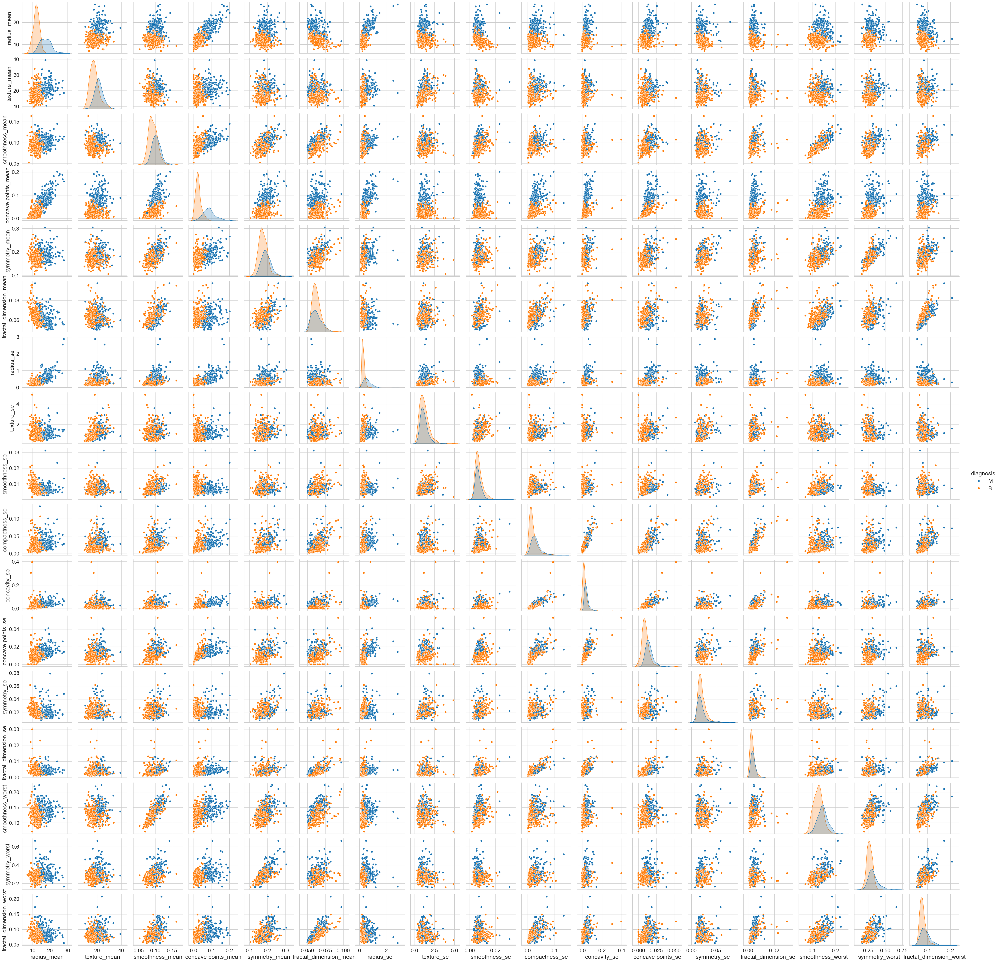

In [ ]:
sns.pairplot(df, hue=target)
plt.show()

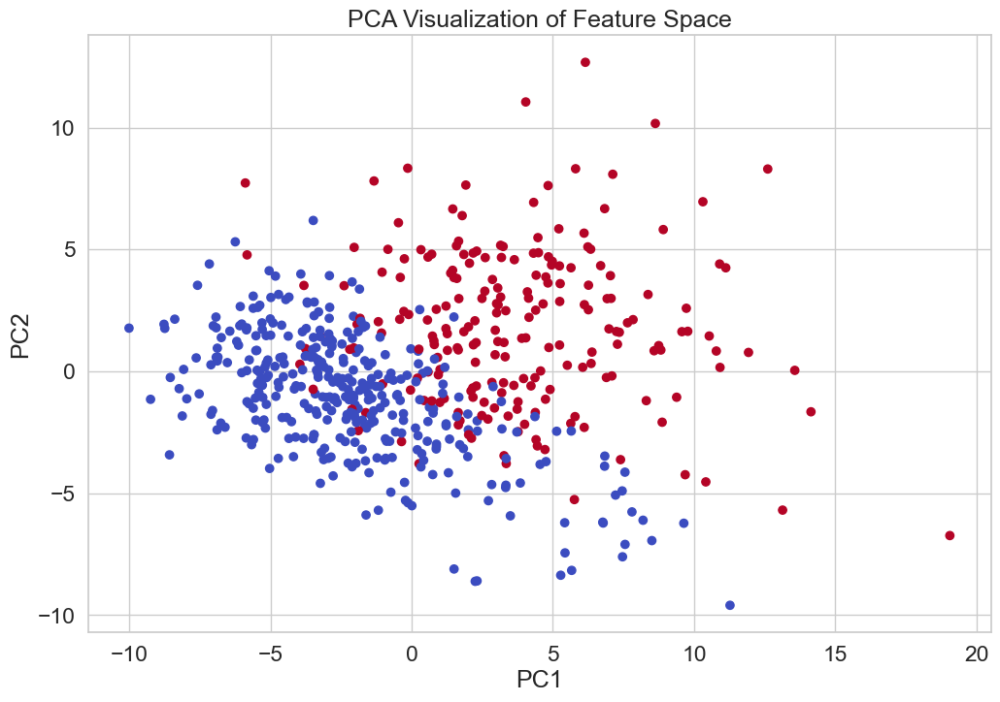

In [ ]:
pca = PCA(n_components=2)
X_pca = pca.fit_transform(df.drop(columns=[target]))
plt.scatter(
    X_pca[:, 0], X_pca[:, 1], c=df[target].map({"B": 0, "M": 1}), cmap="coolwarm"
)
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.title("PCA Visualization of Feature Space")
plt.show()

## Insights


- Seems like almost all of the remaining features could separate the target when combined with another feature.
- The PCA plot shows that there is good enough separability between the classes.


# Outlier Detection


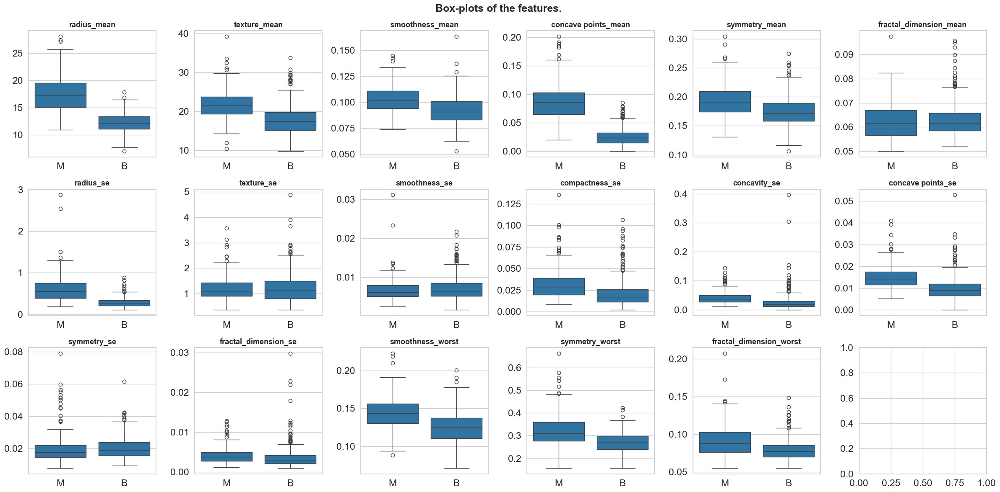

In [ ]:
fig, axes = plt.subplots(3, 6, figsize=(24, 12))
axes = axes.ravel()


for i, col in enumerate(mean_cols + se_cols + worst_cols):
    sns.boxplot(data=df, x=target, y=col, ax=axes[i])
    axes[i].set_title(f"{col}", fontsize=13, fontweight="bold")
    axes[i].set_xlabel("")
    axes[i].set_ylabel("")


fig.suptitle("Box-plots of the features.", fontsize=18, fontweight="bold")
plt.subplots_adjust(wspace=0.3, hspace=0.3)
plt.tight_layout()
plt.show()

## Insights


- There are outliers, but they are meaningful.


# Saving Data


In [ ]:
df.to_csv("../data/interim/data_selected.csv", index=False)